# 4D


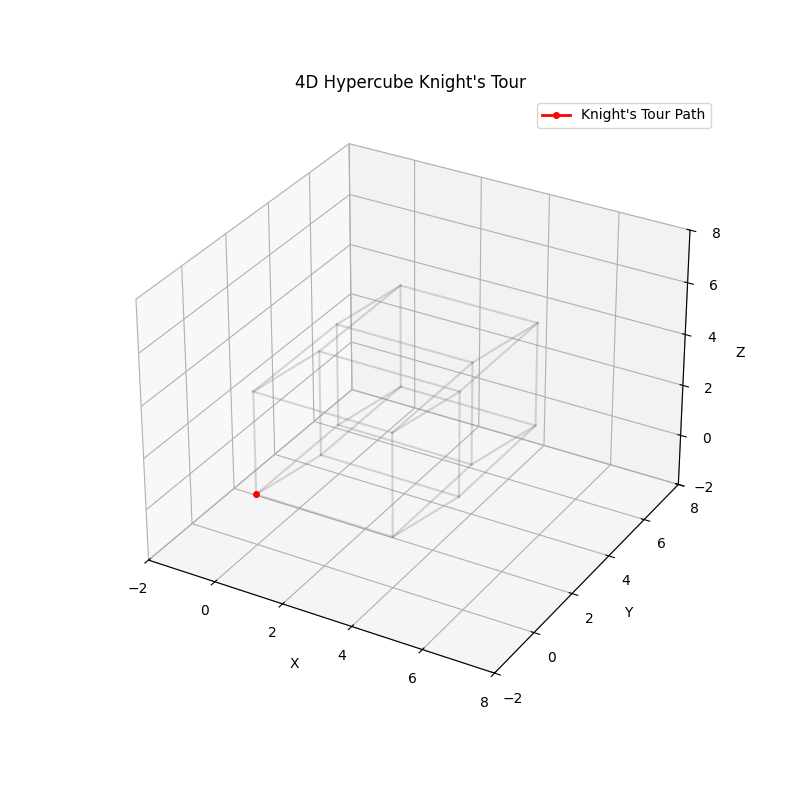

In [2]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation, PillowWriter, FFMpegWriter
from IPython.display import Image, display, HTML
import itertools

# --- 기존 코드와 동일한 설정 부분 ---

# 4D 하이퍼큐브 꼭짓점 생성 (좌표 범위를 조금 늘려 경로가 잘 보이게 함)
vertices = [(x,y,z,w) for x in [0,4] for y in [0,4] for z in [0,4] for w in [0,4]]

# 4D -> 3D 투영
def project(v, offset=0.3):
    x, y, z, w = v
    return (x + w*offset, y + w*offset, z + w*offset)

proj_vertices = [project(v) for v in vertices]

# 예시 4D 경로 (기존과 동일)
path_4d = [
(0,0,0,0),
(2,1,0,0),
(4,0,0,0),
(2,0,1,0),
(0,1,1,0),
(0,0,3,0),
(0,0,1,1),
(0,0,0,3),
(0,1,0,1),
(0,3,0,0),
(2,4,0,0),
(4,3,0,0),
(4,1,1,0),
(4,0,3,0),
(2,0,4,0),
(0,1,4,0),
(0,0,2,0),
(0,0,4,1),
(0,2,4,0),
(1,0,4,0),
(0,0,4,2),
(1,0,4,4),
(0,0,2,4),
(0,1,4,4),
(2,0,4,4),
(0,0,3,4),
(0,2,4,4),
(0,0,4,3),
(1,0,4,1),
(3,0,4,0),
(4,2,4,0),
(4,0,4,1),
(4,0,2,0),
(4,1,4,0),
(4,0,4,2),
(4,1,4,4),
(4,0,2,4),
(3,0,4,4),
(1,0,4,3),
(3,0,4,2),
(4,0,4,0),
(2,0,4,1),
(0,0,4,0),
(0,0,2,1),
(0,1,4,1),
(0,3,4,0),
(0,4,2,0),
(1,4,4,0),
(0,4,4,2),
(1,4,4,4),
(3,3,4,4),
(1,2,4,4),
(0,0,4,4),
(0,2,4,3),
(0,4,4,4),
(0,3,4,2),
(0,4,4,0),
(0,2,3,0),
(1,0,3,0),
(0,0,1,0),
(0,0,3,1),
(0,2,4,1),
(0,1,4,3),
(0,3,4,4),
(2,4,4,4),
(0,4,3,4),
(1,4,1,4),
(3,4,0,4),
(4,4,0,2),
(4,4,1,0),
(4,2,0,0),
(3,0,0,0),
(1,0,0,1),
(1,0,2,0),
(3,0,3,0),
(4,0,1,0),
(2,0,0,0),
(4,0,0,1),
(3,0,0,3),
(1,0,0,4),
(0,0,0,2),
(0,1,0,0),
(1,3,0,0),
(3,4,0,0),
(4,4,2,0),
(4,4,0,1),
(3,4,0,3),
(1,4,0,4),
(0,2,0,4),
(0,0,1,4),
(0,0,3,3),
(2,0,4,3),
(4,0,4,4),
(2,1,4,4),
(1,3,4,4),
(3,4,4,4),
(4,2,4,4),
(4,0,3,4),
(3,0,1,4),
(2,0,3,4),
(0,1,3,4),
(0,0,3,2),
(1,0,3,4),
(1,0,1,3),
(1,0,3,2),
(0,0,1,2),
(0,0,0,4),
(0,0,2,3),
(1,0,0,3),
(0,0,0,1),
(0,0,1,3),
(1,0,1,1),
(3,0,1,0),
(1,0,0,0),
(0,2,0,0),
(0,4,0,1),
(1,4,0,3),
(0,2,0,3),
(0,4,0,4),
(0,2,1,4),
(0,4,2,4),
(0,4,4,3),
(0,3,4,1),
(0,1,4,2),
(1,1,4,0),
(0,1,2,0),
(1,1,0,0),
(3,2,0,0),
(4,4,0,0),
(4,2,1,0),
(4,3,3,0),
(2,3,4,0),
(4,4,4,0),
(4,2,3,0),
(3,4,3,0),
(3,2,4,0),
(1,3,4,0),
(3,4,4,0),
(1,4,4,1),
(1,2,4,0),
(3,1,4,0),
(4,3,4,0),
(2,4,4,0),
(0,4,3,0),
(0,3,1,0),
(0,3,0,2),
(0,4,0,0),
(1,4,2,0),
(0,2,2,0),
(0,4,1,0),
(0,3,3,0),
(1,1,3,0),
(1,0,1,0),
(2,0,3,0),
(0,1,3,0),
(0,3,2,0),
(0,3,0,1),
(0,4,0,3),
(1,4,0,1),
(0,4,2,1),
(0,4,0,2),
(1,4,0,0),
(3,4,1,0),
(4,4,3,0),
(4,4,4,2),
(4,4,3,4),
(3,4,1,4),
(1,4,2,4),
(1,4,4,3),
(0,4,4,1),
(0,3,4,3),
(0,4,2,3),
(0,4,3,1),
(2,4,3,0),
(2,2,4,0),
(2,4,4,1),
(4,4,3,1),
(4,4,4,3),
(4,3,4,1),
(4,1,4,2),
(4,1,3,0),
(2,1,4,0),
(2,0,4,2),
(4,0,4,3),
(4,0,3,1),
(4,2,4,1),
(3,0,4,1),
(1,0,4,2),
(0,2,4,2),
(1,4,4,2),
(3,4,4,1),
(4,4,2,1),
(2,4,2,0),
(4,3,2,0),
(3,3,4,0),
(3,4,4,2),
(4,4,4,4),
(2,4,4,3),
(4,3,4,3),
(4,4,4,1),
(3,4,4,3),
(4,4,2,3),
(4,4,0,4),
(3,4,2,4),
(1,4,3,4),
(0,4,1,4),
(0,4,2,2),
(0,3,2,4),
(1,3,0,4),
(0,1,0,4),
(0,2,2,4),
(0,3,0,4),
(2,4,0,4),
(4,3,0,4),
(4,4,2,4),
(4,3,4,4),
(3,1,4,4),
(2,3,4,4),
(1,1,4,4),
(1,0,2,4),
(0,0,2,2),
(0,1,0,2),
(0,3,0,3),
(0,2,0,1),
(0,1,0,3),
(0,1,2,4),
(0,3,3,4),
(0,4,3,2),
(1,4,3,0),
(3,4,2,0),
(1,4,1,0),
(1,4,0,2),
(3,4,0,1),
(4,4,0,3),
(4,4,1,1),
(2,4,0,1),
(0,4,1,1),
(0,2,1,0),
(2,2,0,0),
(4,1,0,0),
(3,3,0,0),
(1,2,0,0),
(0,2,0,2),
(0,4,1,2),
(0,4,3,3),
(0,2,3,4),
(0,1,1,4),
(0,3,1,3),
(0,2,1,1),
(0,2,3,2),
(0,1,1,2),
(0,1,3,1),
(0,3,2,1),
(1,3,0,1),
(1,4,2,1),
(1,3,4,1),
(2,1,4,1),
(3,3,4,1),
(4,1,4,1),
(4,3,4,2),
(4,1,4,3),
(3,3,4,3),
(1,3,4,2),
(1,1,4,1),
(3,2,4,1),
(3,1,4,3),
(1,2,4,3),
(0,2,2,3),
(0,4,1,3),
(2,4,0,3),
(2,4,2,4),
(4,4,1,4),
(4,4,2,2),
(3,4,0,2),
(3,3,0,4),
(4,1,0,4),
(2,0,0,4),
(1,2,0,4),
(1,0,1,4),
(3,0,0,4),
(4,0,0,2),
(4,0,1,4),
(4,2,0,4),
(4,0,0,3),
(3,0,0,1),
(1,0,0,2),
(1,1,0,4),
(3,2,0,4),
(4,0,0,4),
(2,1,0,4),
(2,0,2,4),
(2,0,0,3),
(1,2,0,3),
(1,4,1,3),
(0,2,1,3),
(0,1,3,3),
(0,3,3,2),
(0,3,1,1),
(0,1,2,1),
(0,3,3,1),
(2,3,4,1),
(1,3,4,3),
(0,3,2,3),
(0,1,2,2),
(1,1,4,2),
(3,1,4,1),
(2,1,4,3),
(4,2,4,3),
(3,0,4,3),
(4,0,2,3),
(4,1,0,3),
(4,2,0,1),
(4,0,1,1),
(2,0,0,1),
(2,0,2,0),
(4,1,2,0),
(4,1,0,1),
(4,0,2,1),
(4,2,2,0),
(3,0,2,0),
(3,1,0,0),
(2,3,0,0),
(4,3,0,1),
(4,2,0,3),
(4,2,2,4),
(3,0,2,4),
(4,0,2,2),
(3,0,0,2),
(3,1,0,4),
(4,1,2,4),
(4,3,3,4),
(2,4,3,4),
(2,2,4,4),
(2,3,4,2),
(4,2,4,2),
(3,2,4,4),
(2,2,4,2),
(2,2,3,0),
(0,2,3,1),
(0,1,1,1),
(0,3,1,2),
(0,1,1,3),
(0,3,1,4),
(0,3,3,3),
(0,1,3,2),
(0,3,2,2),
(0,1,2,3),
(0,2,2,1),
(0,2,3,3),
(0,2,1,2),
(1,2,1,0),
(2,4,1,0),
(2,2,2,0),
(2,2,4,1),
(2,4,4,2),
(2,2,4,3),
(1,2,4,1),
(1,1,4,3),
(2,3,4,3),
(2,1,4,2),
(3,3,4,2),
(1,2,4,2),
(3,1,4,2),
(3,1,3,0),
(2,3,3,0),
(2,1,2,0),
(1,3,2,0),
(3,3,1,0),
(2,1,1,0),
(1,3,1,0),
(3,3,2,0),
(1,3,3,0),
(1,1,2,0),
(3,2,2,0),
(1,2,3,0),
(1,1,1,0),
(2,3,1,0),
(3,1,1,0),
(4,3,1,0),
(3,3,3,0),
(2,1,3,0),
(2,3,2,0),
(3,1,2,0),
(1,2,2,0),
(3,2,1,0),
(3,4,1,1),
(4,4,1,3),
(4,4,3,2),
(2,4,2,2),
(4,4,1,2),
(4,4,3,3),
(3,4,3,1),
(3,2,3,0),
(2,2,1,0),
(2,4,1,1),
(1,4,3,1),
(2,4,3,3),
(2,4,1,4),
(3,4,3,4),
(2,4,3,2),
(1,4,1,2),
(1,4,3,3),
(3,4,2,3),
(2,4,2,1),
(2,4,0,2),
(4,3,0,2),
(4,3,1,4),
(2,3,0,4),
(2,2,0,2),
(2,4,1,2),
(1,4,3,2),
(3,4,2,2),
(1,4,2,3),
(3,4,1,3),
(3,4,3,2),
(3,2,4,2),
(3,0,3,2),
(1,0,3,1),
(3,0,2,1),
(1,0,2,2),
(0,2,2,2),
(1,4,2,2),
(3,4,1,2),
(1,4,1,1),
(2,4,3,1),
(2,4,2,3),
(3,4,2,1),
(3,4,3,3),
(2,4,1,3),
(2,2,1,4),
(1,2,3,4),
(1,3,1,4),
(1,1,2,4),
(1,3,3,4),
(3,3,2,4),
(3,1,3,4),
(2,3,3,4),
(4,2,3,4),
(4,0,3,3),
(4,0,1,2),
(4,1,1,4),
(4,3,2,4),
(4,3,0,3),
(4,1,0,2),
(2,0,0,2),
(2,2,0,1),
(4,2,0,2),
(4,3,2,2),
(3,3,0,2),
(1,3,0,3),
(1,1,0,2),
(3,1,0,1),
(1,2,0,1),
(3,2,0,2),
(4,2,2,2),
(4,0,3,2),
(2,0,2,2),
(2,0,1,4),
(3,0,3,4),
(1,1,3,4),
(1,3,2,4),
(3,3,1,4),
(1,2,1,4),
(3,2,2,4),
(3,2,4,3),
(3,0,3,3),
(4,0,1,3),
(2,0,1,2),
(2,0,3,1),
(1,0,3,3),
(3,0,2,3),
(3,1,0,3),
(2,3,0,3),
(1,1,0,3),
(3,2,0,3),
(3,3,0,1),
(1,3,0,2),
(2,1,0,2),
(2,2,0,4),
(1,2,0,2),
(3,2,0,1),
(1,1,0,1),
(2,3,0,1),
(3,3,0,3),
(2,1,0,3),
(2,1,2,4),
(4,1,3,4),
(4,2,1,4),
(2,1,1,4),
(2,3,2,4),
(3,1,2,4),
(1,2,2,4),
(3,2,3,4),
(4,2,3,2),
(4,1,1,2),
(3,1,1,4),
(3,0,1,2),
(3,2,2,2),
(3,1,0,2),
(2,3,0,2),
(2,1,0,1),
(2,2,0,3),
(2,2,2,4),
(2,0,2,3),
(2,2,2,2),
(3,0,2,2),
(1,0,2,1),
(1,2,2,2),
(1,0,2,3),
(2,0,2,1),
(2,0,1,3),
(3,0,1,1),
(1,0,1,2),
(2,0,3,2),
(2,1,3,4),
(1,1,1,4),
(3,2,1,4),
(3,3,3,4),
(2,3,1,4),
(2,2,3,4),
(2,0,3,3),
(3,0,1,3),
(2,0,1,1),
(3,0,3,1),
(3,2,2,1),
(4,2,2,3),
(4,1,2,1),
(2,1,2,2),
(1,3,2,2),
(1,1,2,1),
(3,1,2,2),
(2,3,2,2),
(1,1,2,2),
(1,3,2,1),
(1,2,2,3),
(2,2,2,1),
(4,3,2,1),
(4,1,2,2),
(3,3,2,2),
(3,1,2,3),
(2,3,2,3),
(4,3,1,3),
(4,2,1,1),
(2,2,1,2),
(4,3,1,2),
(4,1,1,3),
(4,3,2,3),
(4,3,3,1),
(4,1,3,2),
(4,3,3,3),
(4,1,2,3),
(4,2,2,1),
(4,2,1,3),
(2,2,2,3),
(4,2,3,3),
(4,1,3,1),
(2,1,2,1),
(4,1,1,1),
(4,2,3,1),
(4,2,1,2),
(4,3,3,2),
(4,1,3,3),
(2,1,2,3),
(3,3,2,3),
(2,3,2,1),
(4,3,1,1),
(2,2,1,1),
(2,2,3,2),
(1,2,1,2),
(3,2,1,3),
(2,2,3,3),
(1,2,3,1),
(3,2,3,2),
(1,1,3,2),
(2,3,3,2),
(3,3,1,2),
(2,1,1,2),
(2,3,1,3),
(1,1,1,3),
(2,1,3,3),
(1,3,3,3),
(1,3,1,2),
(3,3,1,1),
(2,3,3,1),
(3,1,3,1),
(3,1,1,2),
(2,3,1,2),
(3,3,3,2),
(2,1,3,2),
(2,1,1,1),
(1,3,1,1),
(1,3,3,2),
(3,3,3,3),
(1,3,2,3),
(3,3,1,3),
(3,3,2,1),
(1,3,3,1),
(2,1,3,1),
(3,3,3,1),
(2,3,1,1),
(1,1,1,1),
(2,1,1,3),
(3,1,1,1),
(3,1,3,2),
(1,1,3,3),
(2,3,3,3),
(3,1,3,3),
(3,1,2,1),
(1,1,3,1),
(3,2,3,1),
(1,2,2,1),
(1,1,2,3),
(1,3,1,3),
(1,2,3,3),
(3,2,2,3),
(1,2,1,3),
(3,1,1,3),
(1,1,1,2),
(3,2,1,2),
(1,2,1,1),
(1,2,3,2),
(3,2,3,3),
(2,2,1,3),
(3,2,1,1),
(2,2,3,1),


]

proj_path = [project(p) for p in path_4d]

# --- 애니메이션 설정 최적화 ---

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

# 하이퍼큐브 모서리 그리기 (한 번만)
for v1, v2 in itertools.combinations(vertices, 2):
    if sum(a != b for a, b in zip(v1, v2)) == 1:
        p1 = project(v1)
        p2 = project(v2)
        ax.plot([p1[0], p2[0]], [p1[1], p2[1]], [p1[2], p2[2]], color='gray', alpha=0.3)

# 경로를 그릴 선 객체 (하나만 생성)
line, = ax.plot([], [], [], marker='o', color='red', markersize=4, linewidth=2, label="Knight's Tour Path")

# ★★ 최적화의 핵심 ★★
# 텍스트 객체를 처음에 모두 생성하고 숨겨둠
number_texts = []
for idx, (px, py, pz) in enumerate(proj_path):
    # zorder를 높여 선 위에 텍스트가 그려지도록 함
    t = ax.text(px, py, pz, str(idx+1), color='blue', fontsize=8, visible=False, zorder=10)
    number_texts.append(t)

# 좌표축 범위 설정
ax.set_xlim(-2, 8)
ax.set_ylim(-2, 8)
ax.set_zlim(-2, 8)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title("4D Hypercube Knight's Tour")
ax.legend()


# 애니메이션 초기화 함수
def init():
    line.set_data([], [])
    line.set_3d_properties([])
    # 모든 텍스트를 안 보이게 함
    for t in number_texts:
        t.set_visible(False)
    # blit=True를 사용하려면 모든 반환 객체가 튜플 안에 있어야 함
    return (line, *number_texts)

# 애니메이션 업데이트 함수
def update(frame):
    # 경로 데이터를 현재 프레임까지 업데이트
    x, y, z = zip(*proj_path[:frame+1])
    line.set_data(x, y)
    line.set_3d_properties(z)

    # 현재 프레임의 텍스트만 보이게 설정
    if frame > 0:
        number_texts[frame].set_visible(True)
        # 이전 텍스트는 흐리게 처리 (선택적)
        if frame > 1:
             number_texts[frame-1].set_alpha(0.5)

    return (line, *number_texts)

# 프레임 수를 줄여서 테스트 (예: 처음 50개만)
num_frames = 625 # len(proj_path) -> 전체를 보려면 이 주석을 푸세요

ani = FuncAnimation(fig, update, frames=num_frames, init_func=init, blit=True, interval=1000, repeat=False)

# GIF로 저장 (PillowWriter 사용, FPS 증가)
gif_path = "animation4d_cube_optimized.gif"
ani.save(gif_path, writer=PillowWriter(fps=100))

# Colab에서 결과 보기
plt.close(fig) # Figure가 중복 출력되는 것을 방지
display(Image(filename=gif_path))

#(1,0) path

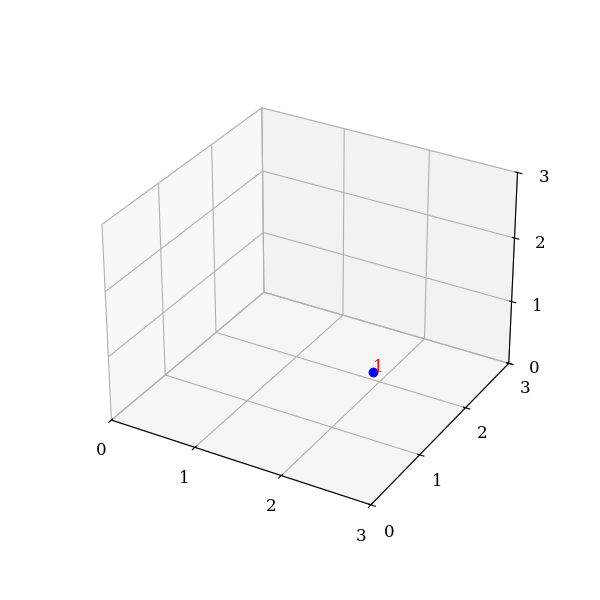

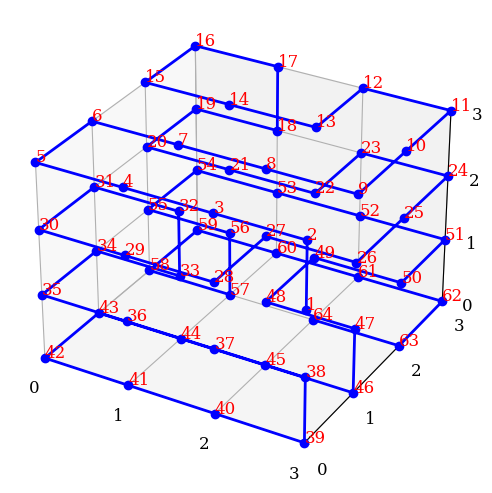

In [ ]:
#(1,0) 3D
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display
import matplotlib.pyplot as plt
import numpy as np


# 예시 3D 경로
path = [
(3,0,2),
(3,0,3),
(2,0,3),
(1,0,3),
(0,0,3),
(0,1,3),
(1,1,3),
(2,1,3),
(3,1,3),
(3,2,3),
(3,3,3),
(2,3,3),
(2,2,3),
(1,2,3),
(0,2,3),
(0,3,3),
(1,3,3),
(1,3,2),
(0,3,2),
(0,2,2),
(1,2,2),
(2,2,2),
(2,3,2),
(3,3,2),
(3,2,2),
(3,1,2),
(2,1,2),
(2,0,2),
(1,0,2),
(0,0,2),
(0,1,2),
(1,1,2),
(1,1,1),
(0,1,1),
(0,0,1),
(1,0,1),
(2,0,1),
(3,0,1),
(3,0,0),
(2,0,0),
(1,0,0),
(0,0,0),
(0,1,0),
(1,1,0),
(2,1,0),
(3,1,0),
(3,1,1),
(2,1,1),
(2,2,1),
(3,2,1),
(3,3,1),
(2,3,1),
(1,3,1),
(0,3,1),
(0,2,1),
(1,2,1),
(1,2,0),
(0,2,0),
(0,3,0),
(1,3,0),
(2,3,0),
(3,3,0),
(3,2,0),
(2,2,0),

]

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')


# 3D 경로 표시를 위한 초기화
line, = ax.plot([], [], [], marker='o', color='b', linewidth=2)
number_texts = []

def init():
    line.set_data([], [])
    line.set_3d_properties([])
    for t in number_texts:
        t.remove()
    number_texts.clear()
    return line,

def update(frame):
    x, y, z = zip(*path[:frame+1])
    line.set_data(x, y)
    line.set_3d_properties(z)

    for t in number_texts:
        t.remove()
    number_texts.clear()

    for idx, (xi, yi, zi) in enumerate(path[:frame+1]):
        t = ax.text(xi, yi, zi, str(idx+1), color='red')
        number_texts.append(t)

    return line, *number_texts

xs, ys, zs = zip(*path)

# 예시: 0,1,2 정수 눈금만 표시
ax.set_xticks(np.arange(0, max(xs)+1, 1))
ax.set_yticks(np.arange(0, max(ys)+1, 1))
ax.set_zticks(np.arange(0, max(zs)+1, 1))

ax.set_xlim(min(xs), max(xs))
ax.set_ylim(min(ys), max(ys))
ax.set_zlim(min(zs), max(zs))


ani = FuncAnimation(fig, update, frames=len(path), init_func=init, blit=True, interval=500, repeat=False)

# GIF로 저장
ani.save("animation3d.gif", writer=PillowWriter(fps=20))
display(Image(filename="animation3d.gif"))


In [ ]:
#(1,0) 3D
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display
import matplotlib.pyplot as plt
import numpy as np


# 예시 3D 경로
path = [
(3,1,4),
(4,1,4),
(4,0,4),
(3,0,4),
(2,0,4),
(1,0,4),
(0,0,4),
(0,1,4),
(1,1,4),
(2,1,4),
(2,2,4),
(3,2,4),
(4,2,4),
(4,3,4),
(4,4,4),
(3,4,4),
(3,3,4),
(2,3,4),
(2,4,4),
(1,4,4),
(0,4,4),
(0,3,4),
(1,3,4),
(1,2,4),
(0,2,4),
(0,2,3),
(0,3,3),
(0,4,3),
(1,4,3),
(2,4,3),
(3,4,3),
(4,4,3),
(4,3,3),
(3,3,3),
(2,3,3),
(1,3,3),
(1,2,3),
(2,2,3),
(3,2,3),
(4,2,3),
(4,1,3),
(4,0,3),
(3,0,3),
(3,1,3),
(2,1,3),
(2,0,3),
(1,0,3),
(0,0,3),
(0,1,3),
(1,1,3),
(1,1,2),
(0,1,2),
(0,0,2),
(1,0,2),
(2,0,2),
(3,0,2),
(4,0,2),
(4,1,2),
(3,1,2),
(2,1,2),
(2,2,2),
(3,2,2),
(4,2,2),
(4,3,2),
(4,4,2),
(3,4,2),
(3,3,2),
(2,3,2),
(2,4,2),
(1,4,2),
(0,4,2),
(0,3,2),
(1,3,2),
(1,2,2),
(0,2,2),
(0,2,1),
(0,3,1),
(0,4,1),
(0,4,0),
(0,3,0),
(0,2,0),
(0,1,0),
(0,0,0),
(0,0,1),
(0,1,1),
(1,1,1),
(1,0,1),
(1,0,0),
(1,1,0),
(1,2,0),
(1,2,1),
(1,3,1),
(1,4,1),
(1,4,0),
(1,3,0),
(2,3,0),
(2,4,0),
(2,4,1),
(2,3,1),
(2,2,1),
(2,2,0),
(2,1,0),
(2,0,0),
(2,0,1),
(2,1,1),
(3,1,1),
(3,0,1),
(4,0,1),
(4,1,1),
(4,2,1),
(3,2,1),
(3,3,1),
(4,3,1),
(4,4,1),
(3,4,1),
(3,4,0),
(4,4,0),
(4,3,0),
(3,3,0),
(3,2,0),
(4,2,0),
(4,1,0),
(3,1,0),
(3,0,0),
(4,0,0),

]

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')


# 3D 경로 표시를 위한 초기화
line, = ax.plot([], [], [], marker='o', color='b', linewidth=2)
number_texts = []

def init():
    line.set_data([], [])
    line.set_3d_properties([])
    for t in number_texts:
        t.remove()
    number_texts.clear()
    return line,

def update(frame):
    x, y, z = zip(*path[:frame+1])
    line.set_data(x, y)
    line.set_3d_properties(z)

    for t in number_texts:
        t.remove()
    number_texts.clear()

    for idx, (xi, yi, zi) in enumerate(path[:frame+1]):
        t = ax.text(xi, yi, zi, str(idx+1), color='red')
        number_texts.append(t)

    return line, *number_texts

xs, ys, zs = zip(*path)

# 예시: 0,1,2 정수 눈금만 표시
ax.set_xticks(np.arange(0, max(xs)+1, 1))
ax.set_yticks(np.arange(0, max(ys)+1, 1))
ax.set_zticks(np.arange(0, max(zs)+1, 1))

ax.set_xlim(min(xs), max(xs))
ax.set_ylim(min(ys), max(ys))
ax.set_zlim(min(zs), max(zs))


ani = FuncAnimation(fig, update, frames=len(path), init_func=init, blit=True, interval=500, repeat=False)

# GIF로 저장
ani.save("animation3d.gif", writer=PillowWriter(fps=20))
display(Image(filename="animation3d.gif"))


Output hidden; open in https://colab.research.google.com to view.

# (2,1) path

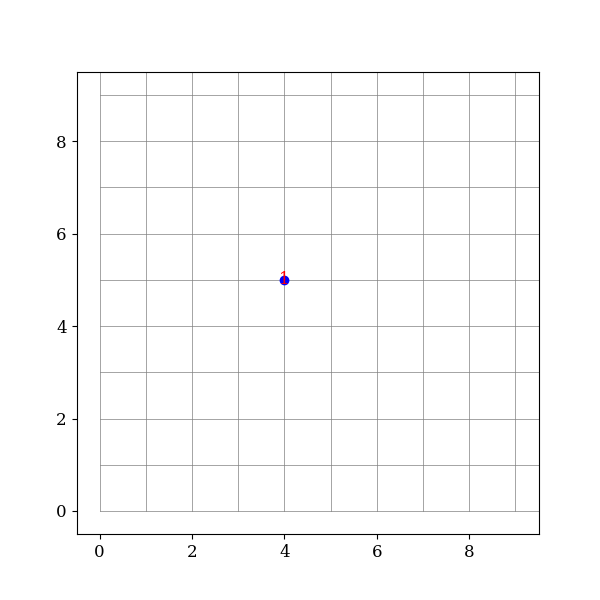

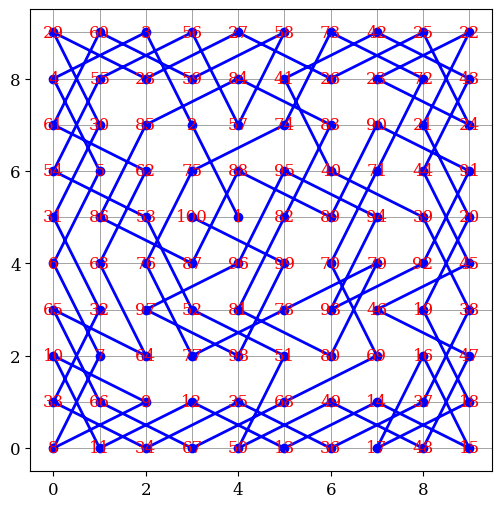

In [ ]:
#2d W+
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display

# 격자 크기
N = 10
path = [
    (4,5),
(3,7),
(2,9),
(0,8),
(1,6),
(0,4),
(1,2),
(0,0),
(2,1),
(0,2),
(1,0),
(3,1),
(5,0),
(7,1),
(9,0),
(8,2),
(7,0),
(9,1),
(8,3),
(9,5),
(8,7),
(9,9),
(7,8),
(9,7),
(8,9),
(6,8),
(4,9),
(2,8),
(0,9),
(1,7),
(0,5),
(1,3),
(0,1),
(2,0),
(4,1),
(6,0),
(8,1),
(9,3),
(8,5),
(6,6),
(5,8),
(7,9),
(9,8),
(8,6),
(9,4),
(7,3),
(9,2),
(8,0),
(6,1),
(4,0),
(5,2),
(3,3),
(2,5),
(0,6),
(1,8),
(3,9),
(4,7),
(5,9),
(3,8),
(1,9),
(0,7),
(2,6),
(1,4),
(2,2),
(0,3),
(1,1),
(3,0),
(5,1),
(7,2),
(6,4),
(7,6),
(8,8),
(6,9),
(5,7),
(3,6),
(2,4),
(3,2),
(5,3),
(7,4),
(6,2),
(4,3),
(5,5),
(6,7),
(4,8),
(2,7),
(1,5),
(3,4),
(4,6),
(6,5),
(7,7),
(9,6),
(8,4),
(6,3),
(7,5),
(5,6),
(4,4),
(2,3),
(4,2),
(5,4),
(3,5),

]

fig, ax = plt.subplots(figsize=(6,6))
for i in range(N+1):
    ax.plot([0, N], [i, i], color='gray', linewidth=0.5)
    ax.plot([i, i], [0, N], color='gray', linewidth=0.5)
ax.set_xlim(-0.5, N-0.5)
ax.set_ylim(-0.5, N-0.5)
ax.set_aspect('equal')

line, = ax.plot([], [], marker='o', color='b', linewidth=2)
number_texts = []

def init():
    line.set_data([], [])
    for t in number_texts:
        t.remove()
    number_texts.clear()
    return line,

def update(frame):
    x, y = zip(*path[:frame+1])
    line.set_data(x, y)
    for t in number_texts:
        t.remove()
    number_texts.clear()
    for idx, (xi, yi) in enumerate(path[:frame+1]):
        t = ax.text(xi, yi, str(idx+1), color='red', fontsize=12, ha='center', va='center')
        number_texts.append(t)
    return line, *number_texts

ani = FuncAnimation(fig, update, frames=len(path), init_func=init, blit=True, interval=500, repeat=False)

# GIF로 저장
ani.save("animation.gif", writer=PillowWriter(fps=20))

# Colab에서 표시
display(Image(filename="animation.gif"))


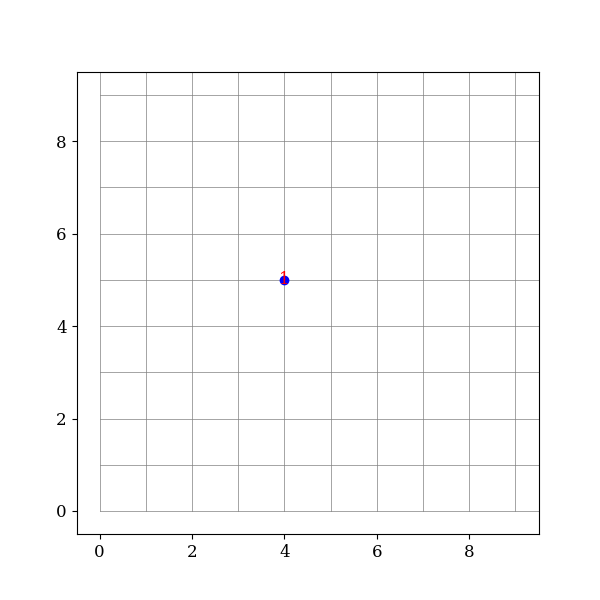

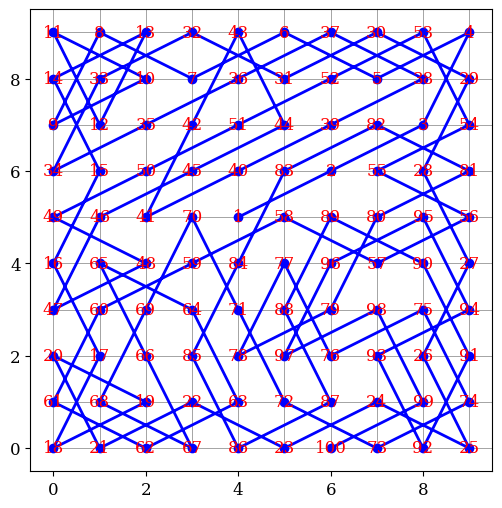

In [ ]:
#2d W
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display

# 격자 크기
N = 10
path = [
(4,5),
(6,6),
(8,7),
(9,9),
(7,8),
(5,9),
(3,8),
(1,9),
(0,7),
(2,8),
(0,9),
(1,7),
(2,9),
(0,8),
(1,6),
(0,4),
(1,2),
(0,0),
(2,1),
(0,2),
(1,0),
(3,1),
(5,0),
(7,1),
(9,0),
(8,2),
(9,4),
(8,6),
(9,8),
(7,9),
(5,8),
(3,9),
(1,8),
(0,6),
(2,7),
(4,8),
(6,9),
(8,8),
(6,7),
(4,6),
(2,5),
(3,7),
(4,9),
(5,7),
(3,6),
(1,5),
(0,3),
(2,4),
(0,5),
(2,6),
(4,7),
(6,8),
(8,9),
(9,7),
(7,6),
(9,5),
(7,4),
(5,5),
(3,4),
(1,3),
(0,1),
(2,0),
(4,1),
(3,3),
(1,4),
(2,2),
(3,0),
(1,1),
(2,3),
(3,5),
(4,3),
(5,1),
(7,0),
(9,1),
(8,3),
(6,2),
(5,4),
(4,2),
(6,3),
(7,5),
(9,6),
(7,7),
(5,6),
(4,4),
(3,2),
(4,0),
(6,1),
(5,3),
(6,5),
(8,4),
(9,2),
(8,0),
(7,2),
(9,3),
(8,5),
(6,4),
(5,2),
(7,3),
(8,1),
(6,0),

]

fig, ax = plt.subplots(figsize=(6,6))
for i in range(N+1):
    ax.plot([0, N], [i, i], color='gray', linewidth=0.5)
    ax.plot([i, i], [0, N], color='gray', linewidth=0.5)
ax.set_xlim(-0.5, N-0.5)
ax.set_ylim(-0.5, N-0.5)
ax.set_aspect('equal')

line, = ax.plot([], [], marker='o', color='b', linewidth=2)
number_texts = []

def init():
    line.set_data([], [])
    for t in number_texts:
        t.remove()
    number_texts.clear()
    return line,

def update(frame):
    x, y = zip(*path[:frame+1])
    line.set_data(x, y)
    for t in number_texts:
        t.remove()
    number_texts.clear()
    for idx, (xi, yi) in enumerate(path[:frame+1]):
        t = ax.text(xi, yi, str(idx+1), color='red', fontsize=12, ha='center', va='center')
        number_texts.append(t)
    return line, *number_texts

ani = FuncAnimation(fig, update, frames=len(path), init_func=init, blit=True, interval=500, repeat=False)

# GIF로 저장
ani.save("animation.gif", writer=PillowWriter(fps=20))

# Colab에서 표시
display(Image(filename="animation.gif"))


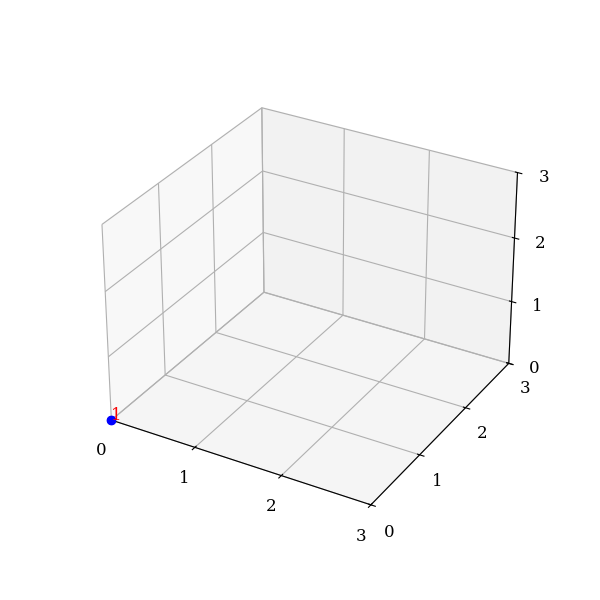

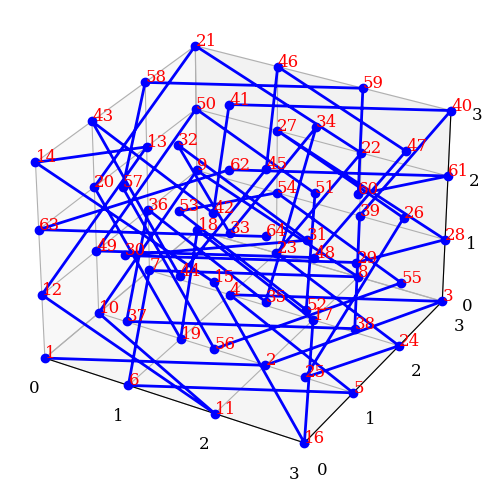

In [ ]:
#(2,1) 3D
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display
import matplotlib.pyplot as plt
import numpy as np


# 예시 3D 경로
path = [
(0,0,0),
(2,1,0),
(3,3,0),
(1,2,0),
(3,1,0),
(1,0,0),
(0,2,0),
(2,3,0),
(0,3,1),
(0,1,0),
(2,0,0),
(0,0,1),
(0,2,2),
(0,0,3),
(2,0,2),
(3,0,0),
(2,2,0),
(0,3,0),
(1,1,0),
(0,1,2),
(0,3,3),
(2,3,2),
(1,3,0),
(3,2,0),
(3,0,1),
(3,2,2),
(1,3,2),
(3,3,1),
(3,1,2),
(1,0,2),
(3,0,3),
(1,1,3),
(1,2,1),
(2,2,3),
(2,1,1),
(0,2,1),
(1,0,1),
(3,1,1),
(2,3,1),
(3,3,3),
(1,2,3),
(2,0,3),
(0,1,3),
(1,1,1),
(2,1,3),
(1,3,3),
(3,2,3),
(2,2,1),
(0,1,1),
(0,3,2),
(2,2,2),
(3,0,2),
(1,1,2),
(1,3,1),
(3,2,1),
(2,0,1),
(1,0,3),
(0,2,3),
(2,3,3),
(3,1,3),
(3,3,2),
(1,2,2),
(0,0,2),
(2,1,2),

]

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')


# 3D 경로 표시를 위한 초기화
line, = ax.plot([], [], [], marker='o', color='b', linewidth=2)
number_texts = []

def init():
    line.set_data([], [])
    line.set_3d_properties([])
    for t in number_texts:
        t.remove()
    number_texts.clear()
    return line,

def update(frame):
    x, y, z = zip(*path[:frame+1])
    line.set_data(x, y)
    line.set_3d_properties(z)

    for t in number_texts:
        t.remove()
    number_texts.clear()

    for idx, (xi, yi, zi) in enumerate(path[:frame+1]):
        t = ax.text(xi, yi, zi, str(idx+1), color='red')
        number_texts.append(t)

    return line, *number_texts

xs, ys, zs = zip(*path)

# 예시: 0,1,2 정수 눈금만 표시
ax.set_xticks(np.arange(0, max(xs)+1, 1))
ax.set_yticks(np.arange(0, max(ys)+1, 1))
ax.set_zticks(np.arange(0, max(zs)+1, 1))

ax.set_xlim(min(xs), max(xs))
ax.set_ylim(min(ys), max(ys))
ax.set_zlim(min(zs), max(zs))


ani = FuncAnimation(fig, update, frames=len(path), init_func=init, blit=True, interval=500, repeat=False)

# GIF로 저장
ani.save("animation3d.gif", writer=PillowWriter(fps=20))
display(Image(filename="animation3d.gif"))


In [ ]:
#(2,1) 3D
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display
import matplotlib.pyplot as plt
import numpy as np


# 예시 3D 경로
path = [
(0,0,0),
(2,1,0),
(4,0,0),
(2,0,1),
(0,1,1),
(0,0,3),
(0,2,4),
(1,0,4),
(0,0,2),
(0,1,0),
(1,3,0),
(3,4,0),
(4,2,0),
(3,0,0),
(1,0,1),
(0,2,1),
(0,4,0),
(0,3,2),
(0,4,4),
(0,2,3),
(0,0,4),
(0,1,2),
(0,3,1),
(0,4,3),
(1,4,1),
(1,2,0),
(2,0,0),
(4,0,1),
(3,0,3),
(1,1,3),
(0,3,3),
(0,1,4),
(1,3,4),
(3,4,4),
(1,4,3),
(0,4,1),
(0,2,0),
(1,0,0),
(3,1,0),
(4,3,0),
(2,4,0),
(0,3,0),
(1,1,0),
(2,3,0),
(4,4,0),
(3,2,0),
(3,0,1),
(1,0,2),
(2,0,4),
(4,0,3),
(4,1,1),
(3,3,1),
(1,2,1),
(0,0,1),
(0,2,2),
(1,4,2),
(3,4,1),
(1,4,0),
(0,4,2),
(0,3,4),
(0,1,3),
(1,1,1),
(1,0,3),
(1,2,4),
(2,4,4),
(4,4,3),
(4,2,4),
(3,0,4),
(1,1,4),
(1,3,3),
(3,4,3),
(4,4,1),
(2,3,1),
(3,1,1),
(3,3,0),
(4,1,0),
(2,2,0),
(2,4,1),
(4,3,1),
(2,2,1),
(2,0,2),
(1,2,2),
(2,4,2),
(1,4,4),
(1,3,2),
(3,4,2),
(3,2,3),
(2,4,3),
(4,4,4),
(2,3,4),
(2,1,3),
(3,3,3),
(1,2,3),
(1,3,1),
(3,2,1),
(2,2,3),
(4,3,3),
(3,1,3),
(3,3,2),
(4,1,2),
(2,1,1),
(4,2,1),
(4,4,2),
(2,3,2),
(1,1,2),
(3,0,2),
(3,1,4),
(3,2,2),
(3,3,4),
(4,1,4),
(4,0,2),
(2,1,2),
(4,2,2),
(4,3,4),
(2,2,4),
(2,0,3),
(4,1,3),
(4,3,2),
(3,1,2),
(3,2,4),
(4,0,4),
(2,1,4),
(2,3,3),
(4,2,3),
(2,2,2),

]

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')


# 3D 경로 표시를 위한 초기화
line, = ax.plot([], [], [], marker='o', color='b', linewidth=2)
number_texts = []

def init():
    line.set_data([], [])
    line.set_3d_properties([])
    for t in number_texts:
        t.remove()
    number_texts.clear()
    return line,

def update(frame):
    x, y, z = zip(*path[:frame+1])
    line.set_data(x, y)
    line.set_3d_properties(z)

    for t in number_texts:
        t.remove()
    number_texts.clear()

    for idx, (xi, yi, zi) in enumerate(path[:frame+1]):
        t = ax.text(xi, yi, zi, str(idx+1), color='red')
        number_texts.append(t)

    return line, *number_texts

xs, ys, zs = zip(*path)

# 예시: 0,1,2 정수 눈금만 표시
ax.set_xticks(np.arange(0, max(xs)+1, 1))
ax.set_yticks(np.arange(0, max(ys)+1, 1))
ax.set_zticks(np.arange(0, max(zs)+1, 1))

ax.set_xlim(min(xs), max(xs))
ax.set_ylim(min(ys), max(ys))
ax.set_zlim(min(zs), max(zs))


ani = FuncAnimation(fig, update, frames=len(path), init_func=init, blit=True, interval=500, repeat=False)

# GIF로 저장
ani.save("animation3d.gif", writer=PillowWriter(fps=20))
display(Image(filename="animation3d.gif"))


Output hidden; open in https://colab.research.google.com to view.

# (2,2,1) path

In [2]:
#(2,1) 3D
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display
import matplotlib.pyplot as plt
import numpy as np


# 예시 3D 경로
path = [
(2,3,1),
(0,1,0),
(2,0,2),
(4,1,0),
(6,0,2),
(7,2,0),
(5,0,1),
(7,1,3),
(6,3,1),
(4,5,0),
(6,7,1),
(7,5,3),
(6,7,5),
(7,5,7),
(5,7,6),
(7,6,4),
(5,7,2),
(7,6,0),
(6,4,2),
(5,6,0),
(7,7,2),
(6,5,0),
(4,7,1),
(6,6,3),
(7,4,1),
(5,2,0),
(7,0,1),
(6,2,3),
(7,0,5),
(5,1,7),
(7,3,6),
(6,1,4),
(4,0,6),
(6,2,7),
(5,0,5),
(7,1,7),
(6,3,5),
(4,1,6),
(6,3,7),
(7,1,5),
(5,0,7),
(7,2,6),
(6,0,4),
(7,2,2),
(6,0,0),
(4,2,1),
(2,0,0),
(0,2,1),
(1,0,3),
(3,1,1),
(1,3,0),
(0,1,2),
(2,0,4),
(0,1,6),
(2,3,7),
(0,5,6),
(2,7,7),
(0,6,5),
(1,4,7),
(0,2,5),
(1,0,7),
(3,2,6),
(1,0,5),
(0,2,7),
(2,0,6),
(0,1,4),
(1,3,6),
(3,1,7),
(5,3,6),
(7,2,4),
(6,0,6),
(4,2,7),
(6,4,6),
(4,6,7),
(2,7,5),
(0,6,7),
(2,4,6),
(0,5,4),
(1,7,6),
(3,5,7),
(1,6,5),
(3,7,7),
(1,5,6),
(0,7,4),
(2,6,6),
(0,4,7),
(2,2,6),
(0,0,7),
(2,1,5),
(4,0,7),
(6,1,5),
(7,3,7),
(5,1,6),
(7,0,4),
(6,2,6),
(4,4,7),
(6,6,6),
(7,4,4),
(6,6,2),
(4,7,0),
(6,5,1),
(7,7,3),
(5,6,1),
(7,4,0),
(6,2,2),
(7,0,0),
(5,1,2),
(3,0,0),
(1,2,1),
(0,0,3),
(2,1,1),
(0,3,0),
(1,1,2),
(0,3,4),
(1,1,6),
(3,0,4),
(1,2,5),
(2,0,7),
(0,2,6),
(1,0,4),
(3,1,6),
(1,3,7),
(0,1,5),
(2,0,3),
(0,1,1),
(2,3,0),
(0,5,1),
(2,7,0),
(0,6,2),
(1,4,0),
(0,2,2),
(1,0,0),
(3,1,2),
(5,0,0),
(7,1,2),
(6,3,0),
(4,1,1),
(6,0,3),
(7,2,1),
(5,4,0),
(7,6,1),
(5,7,3),
(3,6,1),
(1,7,3),
(0,5,5),
(1,7,7),
(3,6,5),
(5,7,7),
(7,6,5),
(5,5,7),
(7,7,6),
(6,5,4),
(7,3,2),
(6,1,0),
(4,0,2),
(2,1,0),
(0,0,2),
(1,2,0),
(3,0,1),
(1,1,3),
(0,3,1),
(2,5,0),
(0,7,1),
(1,5,3),
(0,7,5),
(1,5,7),
(3,7,6),
(1,6,4),
(3,7,2),
(1,6,0),
(0,4,2),
(2,6,1),
(0,4,0),
(1,6,2),
(3,7,0),
(1,5,1),
(0,7,3),
(1,5,5),
(0,7,7),
(2,6,5),
(0,5,7),
(2,7,6),
(0,6,4),
(1,4,6),
(3,6,7),
(1,7,5),
(0,5,3),
(1,7,1),
(3,5,0),
(1,3,1),
(3,1,0),
(1,0,2),
(0,2,0),
(2,0,1),
(0,1,3),
(2,0,5),
(0,1,7),
(1,3,5),
(2,1,7),
(0,0,5),
(1,2,7),
(3,0,6),
(1,1,4),
(0,3,6),
(2,5,7),
(0,7,6),
(2,5,5),
(4,7,6),
(6,5,7),
(7,7,5),
(5,6,7),
(7,4,6),
(5,6,5),
(7,7,7),
(6,5,5),
(4,7,4),
(3,5,6),
(2,7,4),
(0,6,6),
(2,4,7),
(4,6,6),
(6,4,7),
(7,2,5),
(6,0,7),
(4,2,6),
(5,0,4),
(7,1,6),
(5,3,7),
(7,5,6),
(6,7,4),
(7,5,2),
(6,7,0),
(4,6,2),
(6,4,1),
(4,6,0),
(2,7,2),
(0,6,0),
(2,4,1),
(4,2,0),
(6,0,1),
(4,2,2),
(6,4,3),
(4,5,1),
(6,7,2),
(7,5,0),
(5,7,1),
(7,6,3),
(5,4,4),
(7,2,3),
(6,0,5),
(7,2,7),
(5,0,6),
(7,1,4),
(5,0,2),
(7,1,0),
(5,3,1),
(3,5,2),
(4,3,0),
(6,1,1),
(4,0,3),
(3,2,1),
(1,3,3),
(3,2,5),
(1,0,6),
(3,2,7),
(1,1,5),
(0,3,7),
(2,1,6),
(0,0,4),
(1,2,6),
(3,0,7),
(5,1,5),
(7,0,7),
(5,2,6),
(7,4,7),
(5,6,6),
(7,4,5),
(6,6,7),
(4,7,5),
(2,6,7),
(0,4,6),
(2,3,4),
(4,1,5),
(3,3,7),
(5,5,6),
(6,3,4),
(4,5,5),
(6,7,6),
(7,5,4),
(5,3,3),
(3,1,4),
(2,3,6),
(4,1,7),
(6,3,6),
(4,5,7),
(5,7,5),
(7,6,7),
(5,4,6),
(6,6,4),
(4,4,3),
(5,2,5),
(7,0,6),
(5,2,7),
(4,0,5),
(6,1,7),
(4,3,6),
(6,2,4),
(7,0,2),
(5,1,0),
(7,3,1),
(6,1,3),
(4,3,4),
(2,1,3),
(0,0,1),
(2,2,2),
(4,0,1),
(6,2,0),
(4,1,2),
(2,2,0),
(0,4,1),
(2,6,0),
(0,7,2),
(1,5,0),
(3,7,1),
(1,6,3),
(3,7,5),
(1,6,7),
(0,4,5),
(1,2,3),
(3,0,2),
(1,1,0),
(0,3,2),
(2,2,4),
(0,4,3),
(1,6,1),
(3,7,3),
(2,5,1),
(0,7,0),
(2,6,2),
(0,5,0),
(2,7,1),
(0,6,3),
(1,4,1),
(0,2,3),
(1,0,1),
(3,2,0),
(1,3,2),
(3,4,0),
(5,2,1),
(7,3,3),
(5,1,4),
(7,3,5),
(6,5,3),
(7,7,1),
(5,5,2),
(3,4,4),
(1,5,2),
(3,6,0),
(1,7,2),
(3,6,4),
(1,4,5),
(3,3,3),
(1,5,4),
(3,4,6),
(2,6,4),
(4,7,2),
(6,6,0),
(7,4,2),
(5,5,0),
(3,3,1),
(5,2,3),
(7,1,1),
(5,0,3),
(3,1,5),
(1,3,4),
(3,1,3),
(5,3,2),
(4,1,4),
(2,3,5),
(1,1,7),
(3,0,5),
(5,1,3),
(7,3,4),
(6,1,6),
(4,0,4),
(6,1,2),
(4,0,0),
(6,2,1),
(7,0,3),
(5,1,1),
(7,3,0),
(5,4,2),
(3,5,4),
(1,4,2),
(0,2,4),
(2,4,3),
(0,3,5),
(2,2,7),
(0,0,6),
(2,1,4),
(4,3,5),
(2,2,3),
(4,3,1),
(3,5,3),
(5,4,1),
(7,6,2),
(5,7,0),
(7,5,1),
(5,3,0),
(3,4,2),
(4,2,4),
(6,4,5),
(4,6,4),
(2,4,5),
(3,2,3),
(1,4,4),
(3,6,3),
(4,4,1),
(5,6,3),
(4,4,5),
(2,5,3),
(0,6,1),
(2,4,2),
(4,2,3),
(5,4,5),
(3,2,4),
(4,4,2),
(2,6,3),
(3,4,1),
(4,6,3),
(3,4,5),
(5,6,4),
(4,4,6),
(2,5,4),
(3,3,6),
(1,2,4),
(3,3,2),
(5,5,3),
(7,7,4),
(6,5,6),
(4,7,7),
(2,5,6),
(4,3,7),
(6,2,5),
(4,1,3),
(2,3,2),
(0,4,4),
(1,6,6),
(3,4,7),
(5,3,5),
(4,5,3),
(6,3,2),
(5,5,4),
(3,3,5),
(1,4,3),
(2,2,5),
(0,3,3),
(1,1,1),
(3,0,3),
(5,2,4),
(7,4,3),
(6,6,1),
(4,4,0),
(2,2,1),
(0,0,0),
(2,1,2),
(3,3,0),
(1,2,2),
(3,3,4),
(5,2,2),
(6,4,0),
(4,3,2),
(2,4,0),
(4,6,1),
(3,4,3),
(5,6,2),
(7,7,0),
(5,5,1),
(4,3,3),
(6,5,2),
(4,7,3),
(6,6,5),
(4,4,4),
(2,5,2),
(1,7,0),
(3,5,1),
(2,3,3),
(0,5,2),
(1,7,4),
(3,6,2),
(5,4,3),
(3,2,2),
(5,3,4),
(3,5,5),
(2,7,3),
(4,5,4),
(6,3,3),
(4,2,5),
(2,4,4),
(3,6,6),
(5,4,7),
(7,6,6),
(5,7,4),
(7,5,5),
(6,7,3),
(4,5,2),
(6,4,4),
(4,6,5),
(6,7,7),
(4,5,6),
(3,7,4),
(5,5,5),

]

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')


# 3D 경로 표시를 위한 초기화
line, = ax.plot([], [], [], marker='o', color='b', linewidth=2)
number_texts = []

def init():
    line.set_data([], [])
    line.set_3d_properties([])
    for t in number_texts:
        t.remove()
    number_texts.clear()
    return line,

def update(frame):
    x, y, z = zip(*path[:frame+1])
    line.set_data(x, y)
    line.set_3d_properties(z)

    for t in number_texts:
        t.remove()
    number_texts.clear()

    for idx, (xi, yi, zi) in enumerate(path[:frame+1]):
        t = ax.text(xi, yi, zi, str(idx+1), color='red')
        number_texts.append(t)

    return line, *number_texts

xs, ys, zs = zip(*path)

# 예시: 0,1,2 정수 눈금만 표시
ax.set_xticks(np.arange(0, max(xs)+1, 1))
ax.set_yticks(np.arange(0, max(ys)+1, 1))
ax.set_zticks(np.arange(0, max(zs)+1, 1))

ax.set_xlim(min(xs), max(xs))
ax.set_ylim(min(ys), max(ys))
ax.set_zlim(min(zs), max(zs))


ani = FuncAnimation(fig, update, frames=len(path), init_func=init, blit=True, interval=500, repeat=False)

# GIF로 저장
ani.save("animation3d.gif", writer=PillowWriter(fps=20))
display(Image(filename="animation3d.gif"))


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x78fa0e12a200> (for post_execute):


KeyboardInterrupt: 

In [1]:
#(2,1) 3D
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display
import matplotlib.pyplot as plt
import numpy as np


# 예시 3D 경로
path = [
(2,3,1),
(0,1,0),
(2,0,2),
(4,1,0),
(6,0,2),
(7,2,0),
(5,0,1),
(7,1,3),
(6,3,1),
(4,5,0),
(6,7,1),
(7,5,3),
(6,7,5),
(7,5,7),
(5,7,6),
(7,6,4),
(5,7,2),
(7,6,0),
(6,4,2),
(5,6,0),
(7,7,2),
(6,5,0),
(4,7,1),
(6,6,3),
(7,4,1),
(5,2,0),
(7,0,1),
(6,2,3),
(7,0,5),
(5,1,7),
(7,3,6),
(6,1,4),
(4,0,6),
(6,2,7),
(5,0,5),
(7,1,7),
(6,3,5),
(4,1,6),
(6,3,7),
(7,1,5),
(5,0,7),
(7,2,6),
(6,0,4),
(7,2,2),
(6,0,0),
(4,2,1),
(2,0,0),
(0,2,1),
(1,0,3),
(3,1,1),
(1,3,0),
(0,1,2),
(2,0,4),
(0,1,6),
(2,3,7),
(0,5,6),
(2,7,7),
(0,6,5),
(1,4,7),
(0,2,5),
(1,0,7),
(3,2,6),
(1,0,5),
(0,2,7),
(2,0,6),
(0,1,4),
(1,3,6),
(3,1,7),
(5,3,6),
(7,2,4),
(6,0,6),
(4,2,7),
(6,4,6),
(4,6,7),
(2,7,5),
(0,6,7),
(2,4,6),
(0,5,4),
(1,7,6),
(3,5,7),
(1,6,5),
(3,7,7),
(1,5,6),
(0,7,4),
(2,6,6),
(0,4,7),
(2,2,6),
(0,0,7),
(2,1,5),
(4,0,7),
(6,1,5),
(7,3,7),
(5,1,6),
(7,0,4),
(6,2,6),
(4,4,7),
(6,6,6),
(7,4,4),
(6,6,2),
(4,7,0),
(6,5,1),
(7,7,3),
(5,6,1),
(7,4,0),
(6,2,2),
(7,0,0),
(5,1,2),
(3,0,0),
(1,2,1),
(0,0,3),
(2,1,1),
(0,3,0),
(1,1,2),
(0,3,4),
(1,1,6),
(3,0,4),
(1,2,5),
(2,0,7),
(0,2,6),
(1,0,4),
(3,1,6),
(1,3,7),
(0,1,5),
(2,0,3),
(0,1,1),
(2,3,0),
(0,5,1),
(2,7,0),
(0,6,2),
(1,4,0),
(0,2,2),
(1,0,0),
(3,1,2),
(5,0,0),
(7,1,2),
(6,3,0),
(4,1,1),
(6,0,3),
(7,2,1),
(5,4,0),
(7,6,1),
(5,7,3),
(3,6,1),
(1,7,3),
(0,5,5),
(1,7,7),
(3,6,5),
(5,7,7),
(7,6,5),
(5,5,7),
(7,7,6),
(6,5,4),
(7,3,2),
(6,1,0),
(4,0,2),
(2,1,0),
(0,0,2),
(1,2,0),
(3,0,1),
(1,1,3),
(0,3,1),
(2,5,0),
(0,7,1),
(1,5,3),
(0,7,5),
(1,5,7),
(3,7,6),
(1,6,4),
(3,7,2),
(1,6,0),
(0,4,2),
(2,6,1),
(0,4,0),
(1,6,2),
(3,7,0),
(1,5,1),
(0,7,3),
(1,5,5),
(0,7,7),
(2,6,5),
(0,5,7),
(2,7,6),
(0,6,4),
(1,4,6),
(3,6,7),
(1,7,5),
(0,5,3),
(1,7,1),
(3,5,0),
(1,3,1),
(3,1,0),
(1,0,2),
(0,2,0),
(2,0,1),
(0,1,3),
(2,0,5),
(0,1,7),
(1,3,5),
(2,1,7),
(0,0,5),
(1,2,7),
(3,0,6),
(1,1,4),
(0,3,6),
(2,5,7),
(0,7,6),
(2,5,5),
(4,7,6),
(6,5,7),
(7,7,5),
(5,6,7),
(7,4,6),
(5,6,5),
(7,7,7),
(6,5,5),
(4,7,4),
(3,5,6),
(2,7,4),
(0,6,6),
(2,4,7),
(4,6,6),
(6,4,7),
(7,2,5),
(6,0,7),
(4,2,6),
(5,0,4),
(7,1,6),
(5,3,7),
(7,5,6),
(6,7,4),
(7,5,2),
(6,7,0),
(4,6,2),
(6,4,1),
(4,6,0),
(2,7,2),
(0,6,0),
(2,4,1),
(4,2,0),
(6,0,1),
(4,2,2),
(6,4,3),
(4,5,1),
(6,7,2),
(7,5,0),
(5,7,1),
(7,6,3),
(5,4,4),
(7,2,3),
(6,0,5),
(7,2,7),
(5,0,6),
(7,1,4),
(5,0,2),
(7,1,0),
(5,3,1),
(3,5,2),
(4,3,0),
(6,1,1),
(4,0,3),
(3,2,1),
(1,3,3),
(3,2,5),
(1,0,6),
(3,2,7),
(1,1,5),
(0,3,7),
(2,1,6),
(0,0,4),
(1,2,6),
(3,0,7),
(5,1,5),
(7,0,7),
(5,2,6),
(7,4,7),
(5,6,6),
(7,4,5),
(6,6,7),
(4,7,5),
(2,6,7),
(0,4,6),
(2,3,4),
(4,1,5),
(3,3,7),
(5,5,6),
(6,3,4),
(4,5,5),
(6,7,6),
(7,5,4),
(5,3,3),
(3,1,4),
(2,3,6),
(4,1,7),
(6,3,6),
(4,5,7),
(5,7,5),
(7,6,7),
(5,4,6),
(6,6,4),
(4,4,3),
(5,2,5),
(7,0,6),
(5,2,7),
(4,0,5),
(6,1,7),
(4,3,6),
(6,2,4),
(7,0,2),
(5,1,0),
(7,3,1),
(6,1,3),
(4,3,4),
(2,1,3),
(0,0,1),
(2,2,2),
(4,0,1),
(6,2,0),
(4,1,2),
(2,2,0),
(0,4,1),
(2,6,0),
(0,7,2),
(1,5,0),
(3,7,1),
(1,6,3),
(3,7,5),
(1,6,7),
(0,4,5),
(1,2,3),
(3,0,2),
(1,1,0),
(0,3,2),
(2,2,4),
(0,4,3),
(1,6,1),
(3,7,3),
(2,5,1),
(0,7,0),
(2,6,2),
(0,5,0),
(2,7,1),
(0,6,3),
(1,4,1),
(0,2,3),
(1,0,1),
(3,2,0),
(1,3,2),
(3,4,0),
(5,2,1),
(7,3,3),
(5,1,4),
(7,3,5),
(6,5,3),
(7,7,1),
(5,5,2),
(3,4,4),
(1,5,2),
(3,6,0),
(1,7,2),
(3,6,4),
(1,4,5),
(3,3,3),
(1,5,4),
(3,4,6),
(2,6,4),
(4,7,2),
(6,6,0),
(7,4,2),
(5,5,0),
(3,3,1),
(5,2,3),
(7,1,1),
(5,0,3),
(3,1,5),
(1,3,4),
(3,1,3),
(5,3,2),
(4,1,4),
(2,3,5),
(1,1,7),
(3,0,5),
(5,1,3),
(7,3,4),
(6,1,6),
(4,0,4),
(6,1,2),
(4,0,0),
(6,2,1),
(7,0,3),
(5,1,1),
(7,3,0),
(5,4,2),
(3,5,4),
(1,4,2),
(0,2,4),
(2,4,3),
(0,3,5),
(2,2,7),
(0,0,6),
(2,1,4),
(4,3,5),
(2,2,3),
(4,3,1),
(3,5,3),
(5,4,1),
(7,6,2),
(5,7,0),
(7,5,1),
(5,3,0),
(3,4,2),
(4,2,4),
(6,4,5),
(4,6,4),
(2,4,5),
(3,2,3),
(1,4,4),
(3,6,3),
(4,4,1),
(5,6,3),
(4,4,5),
(2,5,3),
(0,6,1),
(2,4,2),
(4,2,3),
(5,4,5),
(3,2,4),
(4,4,2),
(2,6,3),
(3,4,1),
(4,6,3),
(3,4,5),
(5,6,4),
(4,4,6),
(2,5,4),
(3,3,6),
(1,2,4),
(3,3,2),
(5,5,3),
(7,7,4),
(6,5,6),
(4,7,7),
(2,5,6),
(4,3,7),
(6,2,5),
(4,1,3),
(2,3,2),
(0,4,4),
(1,6,6),
(3,4,7),
(5,3,5),
(4,5,3),
(6,3,2),
(5,5,4),
(3,3,5),
(1,4,3),
(2,2,5),
(0,3,3),
(1,1,1),
(3,0,3),
(5,2,4),
(7,4,3),
(6,6,1),
(4,4,0),
(2,2,1),
(0,0,0),
(2,1,2),
(3,3,0),
(1,2,2),
(3,3,4),
(5,2,2),
(6,4,0),
(4,3,2),
(2,4,0),
(4,6,1),
(3,4,3),
(5,6,2),
(7,7,0),
(5,5,1),
(4,3,3),
(6,5,2),
(4,7,3),
(6,6,5),
(4,4,4),
(2,5,2),
(1,7,0),
(3,5,1),
(2,3,3),
(0,5,2),
(1,7,4),
(3,6,2),
(5,4,3),
(3,2,2),
(5,3,4),
(3,5,5),
(2,7,3),
(4,5,4),
(6,3,3),
(4,2,5),
(2,4,4),
(3,6,6),
(5,4,7),
(7,6,6),
(5,7,4),
(7,5,5),
(6,7,3),
(4,5,2),
(6,4,4),
(4,6,5),
(6,7,7),
(4,5,6),
(3,7,4),
(5,5,5),

]

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')


# 3D 경로 표시를 위한 초기화
line, = ax.plot([], [], [], marker='o', color='b', linewidth=2)
number_texts = []

def init():
    line.set_data([], [])
    line.set_3d_properties([])
    for t in number_texts:
        t.remove()
    number_texts.clear()
    return line,

def update(frame):
    x, y, z = zip(*path[:frame+1])
    line.set_data(x, y)
    line.set_3d_properties(z)

    for t in number_texts:
        t.remove()
    number_texts.clear()

    for idx, (xi, yi, zi) in enumerate(path[:frame+1]):
        t = ax.text(xi, yi, zi, str(idx+1), color='red')
        number_texts.append(t)

    return line, *number_texts

xs, ys, zs = zip(*path)

# 예시: 0,1,2 정수 눈금만 표시
ax.set_xticks(np.arange(0, max(xs)+1, 1))
ax.set_yticks(np.arange(0, max(ys)+1, 1))
ax.set_zticks(np.arange(0, max(zs)+1, 1))

ax.set_xlim(min(xs), max(xs))
ax.set_ylim(min(ys), max(ys))
ax.set_zlim(min(zs), max(zs))


ani = FuncAnimation(fig, update, frames=len(path), init_func=init, blit=True, interval=500, repeat=False)

# GIF로 저장
ani.save("animation3d.gif", writer=PillowWriter(fps=50))
display(Image(filename="animation3d.gif"))


Output hidden; open in https://colab.research.google.com to view.

# 경로

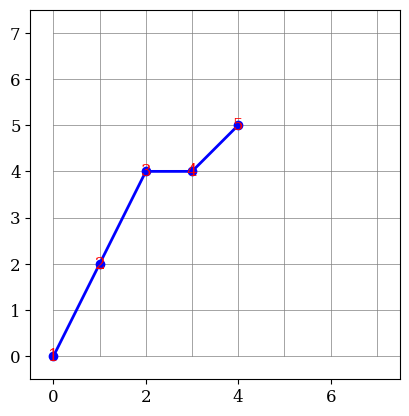

In [ ]:
import matplotlib.pyplot as plt

N = 8  # 격자 크기
path = [(0,0), (1,2), (2,4), (3,4), (4,5)]  # 예시 경로

# 격자 그리기
for i in range(N+1):
    plt.plot([0, N], [i, i], color='gray', linewidth=0.5)  # 가로선
    plt.plot([i, i], [0, N], color='gray', linewidth=0.5)  # 세로선

# 경로 그리기
x, y = zip(*path)
plt.plot(x, y, marker='o', color='b', linewidth=2)
for idx, (xi, yi) in enumerate(path):
    plt.text(xi, yi, str(idx+1), color='red', fontsize=12, ha='center', va='center')

plt.xlim(-0.5, N-0.5)
plt.ylim(-0.5, N-0.5)
plt.gca().set_aspect('equal')
plt.show()


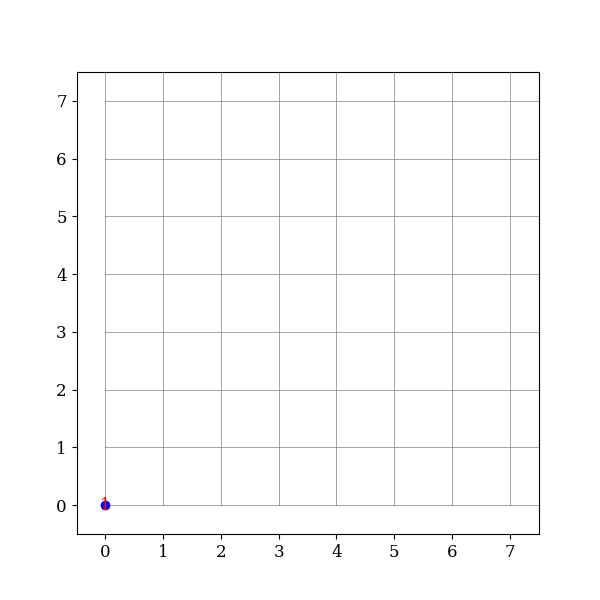

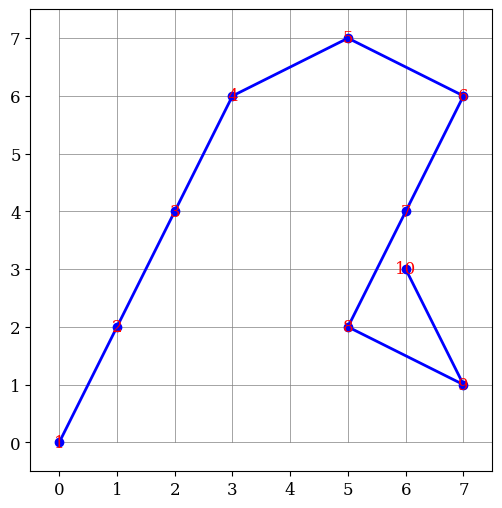

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display

# 격자 크기
N = 8
path = [(0,0), (1,2), (2,4), (3,6), (5,7), (7,6), (6,4), (5,2), (7,1), (6,3)]

fig, ax = plt.subplots(figsize=(6,6))
for i in range(N+1):
    ax.plot([0, N], [i, i], color='gray', linewidth=0.5)
    ax.plot([i, i], [0, N], color='gray', linewidth=0.5)
ax.set_xlim(-0.5, N-0.5)
ax.set_ylim(-0.5, N-0.5)
ax.set_aspect('equal')

line, = ax.plot([], [], marker='o', color='b', linewidth=2)
number_texts = []

def init():
    line.set_data([], [])
    for t in number_texts:
        t.remove()
    number_texts.clear()
    return line,

def update(frame):
    x, y = zip(*path[:frame+1])
    line.set_data(x, y)
    for t in number_texts:
        t.remove()
    number_texts.clear()
    for idx, (xi, yi) in enumerate(path[:frame+1]):
        t = ax.text(xi, yi, str(idx+1), color='red', fontsize=12, ha='center', va='center')
        number_texts.append(t)
    return line, *number_texts

ani = FuncAnimation(fig, update, frames=len(path), init_func=init, blit=True, interval=500, repeat=False)

# GIF로 저장
ani.save("animation.gif", writer=PillowWriter(fps=2))

# Colab에서 표시
display(Image(filename="animation.gif"))


# 새 섹션

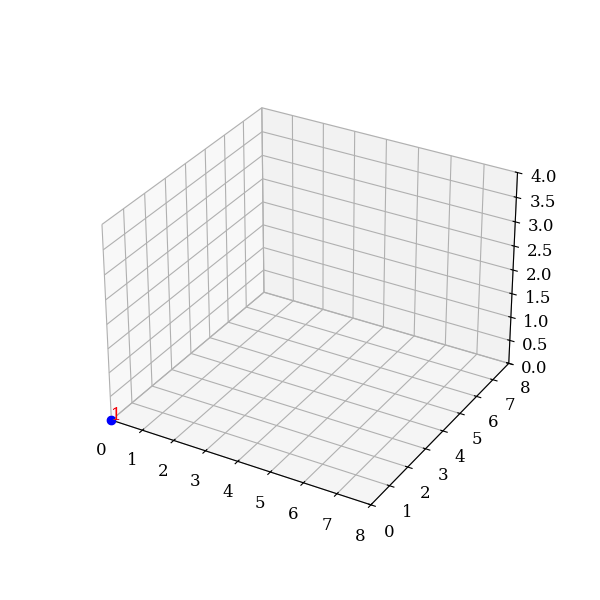

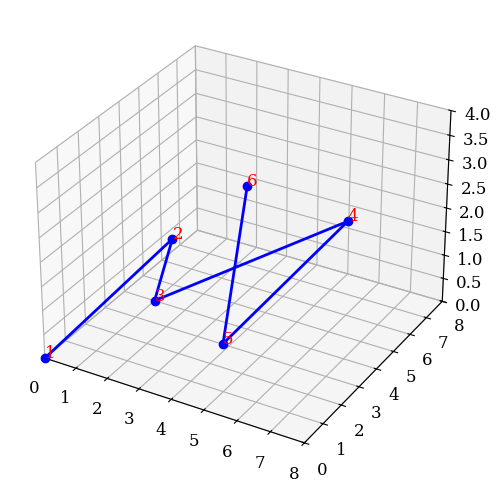

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display

# 예시 3D 경로
path = [(0,0,0), (1,5,1), (1,4,0), (6,6,2), (5,1,1), (4,4,3)]

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')

# 3D 경로 표시를 위한 초기화
line, = ax.plot([], [], [], marker='o', color='b', linewidth=2)
number_texts = []

def init():
    line.set_data([], [])
    line.set_3d_properties([])
    for t in number_texts:
        t.remove()
    number_texts.clear()
    return line,

def update(frame):
    x, y, z = zip(*path[:frame+1])
    line.set_data(x, y)
    line.set_3d_properties(z)

    for t in number_texts:
        t.remove()
    number_texts.clear()

    for idx, (xi, yi, zi) in enumerate(path[:frame+1]):
        t = ax.text(xi, yi, zi, str(idx+1), color='red')
        number_texts.append(t)

    return line, *number_texts

ax.set_xlim(0, 8)
ax.set_ylim(0, 8)
ax.set_zlim(0, 4)

ani = FuncAnimation(fig, update, frames=len(path), init_func=init, blit=True, interval=500, repeat=False)

# GIF로 저장
ani.save("animation3d.gif", writer=PillowWriter(fps=2))
display(Image(filename="animation3d.gif"))


# 메모장


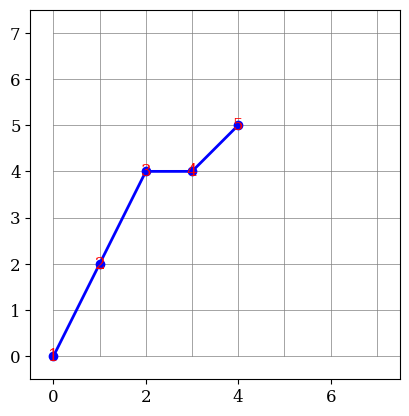

In [ ]:
import matplotlib.pyplot as plt

N = 8  # 격자 크기
path = [(0,0), (1,2), (2,4), (3,4), (4,5)]  # 예시 경로

# 격자 그리기
for i in range(N+1):
    plt.plot([0, N], [i, i], color='gray', linewidth=0.5)  # 가로선
    plt.plot([i, i], [0, N], color='gray', linewidth=0.5)  # 세로선

# 경로 그리기
x, y = zip(*path)
plt.plot(x, y, marker='o', color='b', linewidth=2)
for idx, (xi, yi) in enumerate(path):
    plt.text(xi, yi, str(idx+1), color='red', fontsize=12, ha='center', va='center')

plt.xlim(-0.5, N-0.5)
plt.ylim(-0.5, N-0.5)
plt.gca().set_aspect('equal')
plt.show()


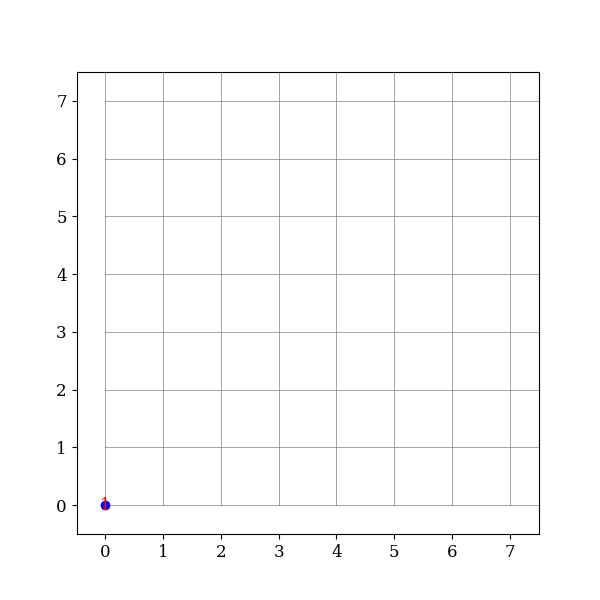

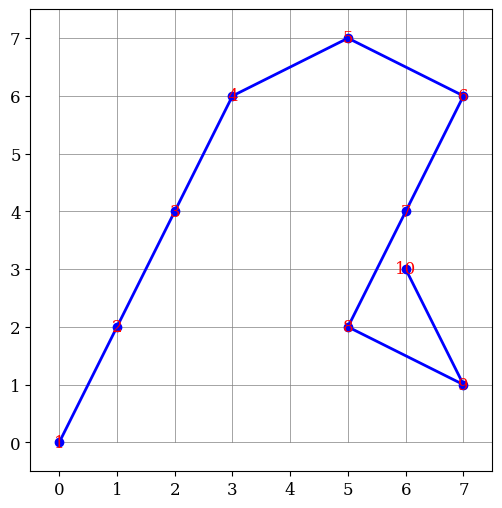

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display

# 격자 크기
N = 8
path = [(0,0), (1,2), (2,4), (3,6), (5,7), (7,6), (6,4), (5,2), (7,1), (6,3)]

fig, ax = plt.subplots(figsize=(6,6))
for i in range(N+1):
    ax.plot([0, N], [i, i], color='gray', linewidth=0.5)
    ax.plot([i, i], [0, N], color='gray', linewidth=0.5)
ax.set_xlim(-0.5, N-0.5)
ax.set_ylim(-0.5, N-0.5)
ax.set_aspect('equal')

line, = ax.plot([], [], marker='o', color='b', linewidth=2)
number_texts = []

def init():
    line.set_data([], [])
    for t in number_texts:
        t.remove()
    number_texts.clear()
    return line,

def update(frame):
    x, y = zip(*path[:frame+1])
    line.set_data(x, y)
    for t in number_texts:
        t.remove()
    number_texts.clear()
    for idx, (xi, yi) in enumerate(path[:frame+1]):
        t = ax.text(xi, yi, str(idx+1), color='red', fontsize=12, ha='center', va='center')
        number_texts.append(t)
    return line, *number_texts

ani = FuncAnimation(fig, update, frames=len(path), init_func=init, blit=True, interval=500, repeat=False)

# GIF로 저장
ani.save("animation.gif", writer=PillowWriter(fps=2))

# Colab에서 표시
display(Image(filename="animation.gif"))


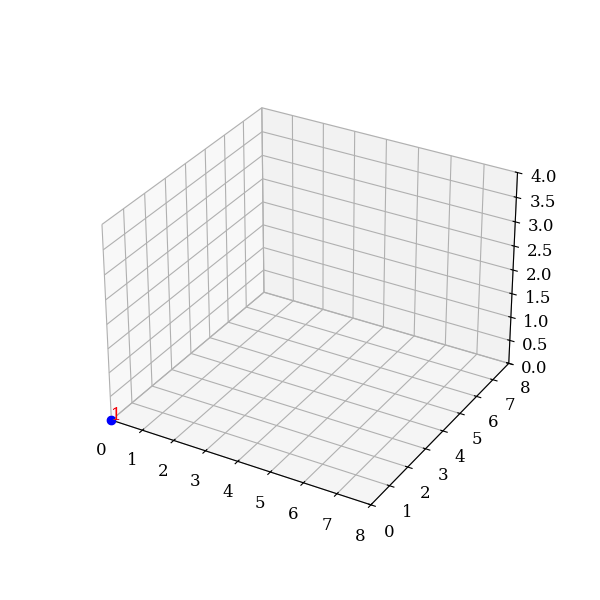

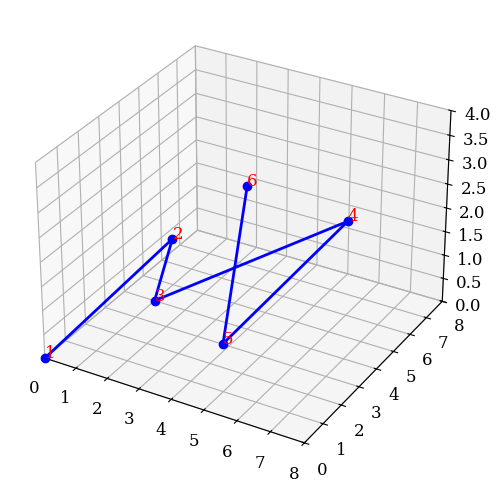

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display

# 예시 3D 경로
path = [(0,0,0), (1,5,1), (1,4,0), (6,6,2), (5,1,1), (4,4,3)]

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')

# 3D 경로 표시를 위한 초기화
line, = ax.plot([], [], [], marker='o', color='b', linewidth=2)
number_texts = []

def init():
    line.set_data([], [])
    line.set_3d_properties([])
    for t in number_texts:
        t.remove()
    number_texts.clear()
    return line,

def update(frame):
    x, y, z = zip(*path[:frame+1])
    line.set_data(x, y)
    line.set_3d_properties(z)

    for t in number_texts:
        t.remove()
    number_texts.clear()

    for idx, (xi, yi, zi) in enumerate(path[:frame+1]):
        t = ax.text(xi, yi, zi, str(idx+1), color='red')
        number_texts.append(t)

    return line, *number_texts

ax.set_xlim(0, 8)
ax.set_ylim(0, 8)
ax.set_zlim(0, 4)

ani = FuncAnimation(fig, update, frames=len(path), init_func=init, blit=True, interval=500, repeat=False)

# GIF로 저장
ani.save("animation3d.gif", writer=PillowWriter(fps=2))
display(Image(filename="animation3d.gif"))


[]

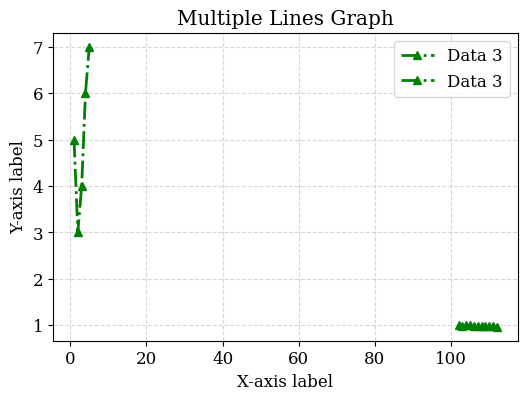

In [ ]:
import matplotlib.pyplot as plt

# 예시 데이터
x = [1, 2, 3, 4, 5]
# y1 = [2, 3, 5, 7, 11]
# y2 = [1, 4, 6, 8, 10]
y3 = [5, 3, 4, 6, 7]
xx=[102,103,104,105,106,107,108,109,110,111,112]
xy=[1,0.99,1,1,0.99,0.99,0.99,0.99,0.99,0.98,0.97]



# 그래프 스타일
plt.figure(figsize=(6,4))
plt.rcParams['font.size'] = 12
plt.rcParams['font.family'] = 'serif'

# 여러 선 그리기
# plt.plot(x, y1, marker='o', linestyle='-', color='b', linewidth=2, markersize=6, label='Data 1')
# plt.plot(x, y2, marker='s', linestyle='--', color='r', linewidth=2, markersize=6, label='Data 2')
plt.plot(x, y3, marker='^', linestyle='-.', color='g', linewidth=2, markersize=6, label='Data 3')
plt.plot(xx, xy, marker='^', linestyle='-.', color='g', linewidth=2, markersize=6, label='Data 3')

# # 라벨, 제목, 그리드
plt.xlabel("X-axis label")
plt.ylabel("Y-axis label")
plt.title("Multiple Lines Graph")
plt.grid(True, linestyle='--', alpha=0.5)

# 범례 표시
plt.legend()

# 저장 및 출력
plt.savefig("figure.svg", format="svg", bbox_inches='tight')
plt.plot()


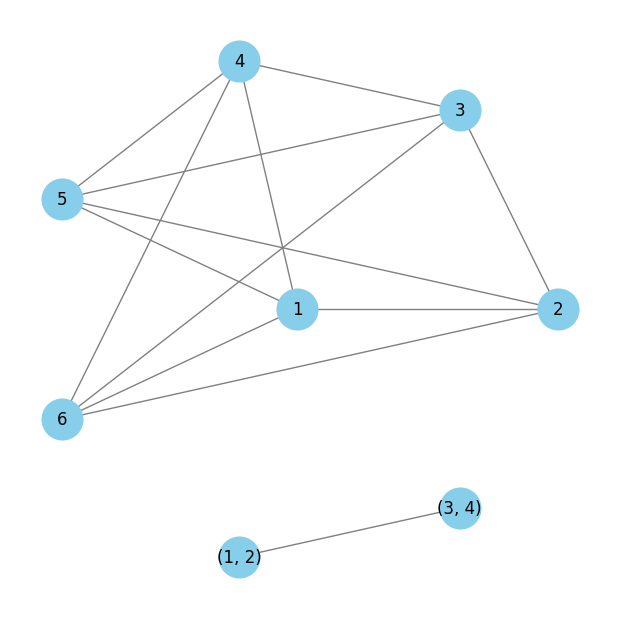

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# 그래프 예시
G = nx.Graph()
G.add_edges_from([
    (1,2),
    (2,3),
    (3,4),
    (4,1),
    (5,1),
    (5,2),
    (5,3),
    (5,4),
    (6,1),
    (6,2),
    (6,3),
    (6,4),
    ((1,2),(3,4)),
    ((1,2),(3,4))
])
# 노드별 degree
degrees = dict(G.degree())

# degree 순으로 노드 분류
# degree 높은 노드는 안쪽, 낮은 노드는 바깥쪽
sorted_nodes = sorted(degrees.items(), key=lambda x: x[1], reverse=True)

# 배치용 변수
pos = {}
center_radius_step = 1.5  # 바깥 노드 레이어 간 거리
angle_step = 2*np.pi / len(G)  # 바깥 원형 각도 간격

# 중심 노드: degree 최대 노드
center_node = sorted_nodes[0][0]
pos[center_node] = (0,0)

# 나머지 노드들을 degree 순서대로 바깥 원형 레이어에 배치
layer = 1
layer_nodes = sorted_nodes[1:]
N = len(layer_nodes)
for i, (node, deg) in enumerate(layer_nodes):
    r = layer * center_radius_step
    theta = i * (2*np.pi/N)
    x = r * np.cos(theta)
    y = r * np.sin(theta)
    pos[node] = (x,y)

# 그림 그리기
plt.figure(figsize=(6,6))
nx.draw(G, pos, with_labels=True, node_color='skyblue', node_size=800, edge_color='gray', linewidths=2)
plt.show()


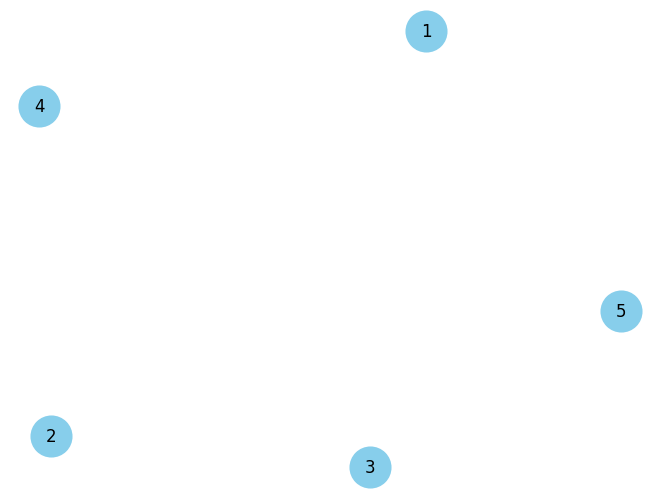

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# 그래프 생성
G = nx.Graph()

# 노드 추가
G.add_nodes_from([1,2,3,4,5])

# 엣지(연결) 추가
G.add_edges_from([

])

# 좌표 자동 계산 (spring layout)
pos = nx.spring_layout(G)  # 노드들이 보기 좋게 배치됨

# 그림 그리기
nx.draw(G, pos, with_labels=True, node_color='skyblue', node_size=800, edge_color='gray', linewidths=2)
plt.show()
